In [1]:
### bit.ly/4oi1pAs

# bit.ly/4oi1pAs

## Introduction into PyPSA-Earth modelling

<div style="display: flex; align-items: center; justify-content: space-between; gap: 1rem; flex-wrap: wrap;">

  <div style="flex: 1; min-width: 250px;">
    <p><strong>Authors:</strong><br>
    Priyesh Gosai – Energy Systems Modeler and Training Coordinator<br>
    Anton Achhammer – PhD Candidate, OTH Regensburg<br>
    Marco Schamel – Graduate Reseracher, OTH Regensburg<br>
    Leon Schumm – PhD Candidate, OTH Regensburg<br>
    Alexander Meisinger – PhD Candidate, OTH Regensburg<br>
    Daniel Rüdt – Energy Systems Modeler<br>
    Thomas Gilon – Energy Systems Modeler</p>

  <div style="flex: 0 0 auto;">
     <a href="https://fenes.oth-regensburg.de/" target="_blank">
    <img src="https://upload.wikimedia.org/wikipedia/commons/c/c2/Logo-OTH-Regensburg.png" height="60" alt="OTH Regensburg logo">
  </a>
  <a href="https://openenergytransition.org/index.html" target="_blank">
      <img src="https://openenergytransition.org/assets/img/oet-logo-red-n-subtitle.png" height="60" alt="Open Energy Transition logo">
    </a>
  </div>

<div style="display: flex; align-items: center; gap: 5px;">

</div>


**Aim:**

This notebook provides an on-hands overview of the capabilities of the sector-coupled energy system modelling framework [PyPSA-Earth](https://github.com/pypsa-meets-earth/pypsa-earth). The scope of the modelling exercise is to explore energy tranisition pathways.

### ⚙️ Setup Environment

In [2]:
# Set to true if this is the first run
first_run = True

In [3]:
# @title Test section
# @markdown This is a test
print('This is a test.')

This is a test.


In [4]:
# # @title Install the required packages
# # @markdown Run this cell to install the necessary Python packages for the project.
# if first_run:
#     import subprocess, sys, importlib

#     packages = [
#         # --- Core modelling ---
#         "numpy==1.26.4",                  # stable, avoids ABI conflicts
#         "scipy<1.16",                     # compatible with PyPSA 0.30.x
#         "pypsa>=0.25,<=0.30.3",           # core modelling toolbox
#         "pypsa[excel]",                   # adds Excel I/O (openpyxl)
#         "highspy",                        # fast open-source solver (HiGHS)
#         "pandas",                         # data handling
#         "xarray>=2023.11.0,<=2025.1.2",   # labelled multi-d arrays
#         "dask",                           # parallel computation backend

#         # --- Energy/weather data ---
#         "atlite>=0.4.1",                  # convert weather data to energy data

#         # --- Geospatial stack ---
#         "geopandas>=1",
#         "rioxarray",
#         "shapely!=2.0.4",
#         "fiona>=1.10",
#         "pyogrio",
#         "rasterio",
#         "contextily",
#         "cartopy",
#         "mapclassify",
#         "geopy",

#         # --- Visualization ---
#         "matplotlib",
#         "hvplot",
#         "holoviews",
#         "geoviews",
#         "plotly",
#         "folium",
#         "seaborn",

#         # --- Utilities ---
#         "country_converter",
#         "tqdm",
#         "rich"
#     ]

#     # Install all packages
#     subprocess.run(
#         [sys.executable, "-m", "pip", "install", "-q", *packages],
#         check=True
#     )

#     # Clean package name extraction (strip versions and extras)
#     def clean_pkg_name(pkg):
#         name = pkg.split("[")[0]  # remove extras
#         for sep in ("=", ">", "<", "!", "~"):
#             name = name.split(sep)[0]
#         return name.strip()

#     import importlib.util
#     missing = [p for p in packages if importlib.util.find_spec(clean_pkg_name(p)) is None]

#     print("✅ All installed!" if not missing else f"❌ Missing: {', '.join(missing)}")


In [10]:
# @title Import necessary packages
# @markdown Here, the necessary Python packages for this exercise are loaded into the notebook.
# @markdown
# @markdown **Note:** If you encounter an error, go to Runtime->Restart session, you find this in the toolbar at the top of the website

import pypsa
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from pypsa.plot import add_legend_circles, add_legend_lines, add_legend_patches

import warnings
warnings.filterwarnings("ignore")

# Standard library
import os
import warnings
import yaml
from pathlib import Path
from datetime import datetime

# Scientific stack
import numpy as np
import pandas as pd
import xarray as xr

# PyPSA + related ecosystem
import pypsa
import atlite
import highspy  # HiGHS solver backend

# Geospatial & mapping
import geopandas as gpd
import folium
import mapclassify
import cartopy
from cartopy import crs as ccrs

# Plotting & visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import holoviews as hv
import hvplot.pandas      # activates .hvplot accessor
import geoviews as gv

# PyPSA plotting helpers
from pypsa.plot import add_legend_circles, add_legend_lines, add_legend_patches

ModuleNotFoundError: No module named 'plotly'

### **You are all set up - Let's go into it**

### 🧭 Navigating the PyPSA Object

**Initialize the PyPSA Network** <br>
This cell initializes a PyPSA network  using the meshed AC/DC example.

In [ ]:
import pypsa
import pandas as pd
pd.options.plotting.backend = "plotly"
example_net = pypsa.examples.ac_dc_meshed()

To create a blank PyPSA `Network`, use:

```python
network = pypsa.Network()
```

To import an existing network from a supported file format (e.g. HDF5, NetCDF, CSV folder, or Excel), pass the file path:

```python
network = pypsa.Network("filename.xx")
```


**Display Network Components** <br>
Here you can see the different compinents of a PyPSA network. They help defining the energy system's structure.

In [ ]:
example_net.components

{'Network': {'list_name': 'networks',
  'description': 'Container for all components and functions which act upon the whole network.',
  'type': nan,
  'attrs':                                                          type     unit  \
  attribute                                                                
  name                                                   string      NaN   
  snapshots                                list or pandas.Index      NaN   
  snapshot_weightings                          pandas.DataFrame   hours    
  investment_periods                               pandas.Index    years   
  investment_period_weightings                 pandas.DataFrame      NaN   
  now                                                       any      NaN   
  srid                                                  integer      NaN   
  crs                                                  CRS-like      NaN   
  buses                                        pandas.DataFrame      NaN   
  bus

In [ ]:
# @title Component naming conventions
# @markdown PyPSA follows Python conventions:
# @markdown   - PascalCase for component classes.
# @markdown   - snake_case for attributes and methods.


for key in example_net.component_attrs:
    print(f'{key.ljust(20)} {example_net.components[key]["list_name"]}')

Network              networks
SubNetwork           sub_networks
Bus                  buses
Carrier              carriers
GlobalConstraint     global_constraints
Line                 lines
LineType             line_types
Transformer          transformers
TransformerType      transformer_types
Link                 links
Load                 loads
Generator            generators
StorageUnit          storage_units
Store                stores
ShuntImpedance       shunt_impedances
Shape                shapes


**Accessing Component Attributes**

We can also access the component attributes directly:

In the next cell, change the `ComponentName` using PascalCase as a string to view the attributes

In [ ]:
ComponentName = 'Generator'
# ComponentName = 'Bus'
# ComponentName = 'Link'
# ComponentName = 'Line'
# ComponentName = 'Carrier'

example_net.component_attrs[ComponentName ]

,type,unit,default,description,status,static,varying,typ,dtype
attribute,,,,,,,,,
name,string,NaN,,Unique name,Input (required),True,False,<class 'str'>,object
bus,string,NaN,,name of bus to which generator is attached,Input (required),True,False,<class 'str'>,object
control,string,NaN,PQ,"P,Q,V control strategy for PF, must be ""PQ"", ""...",Input (optional),True,False,<class 'str'>,object
type,string,NaN,,Placeholder for generator type. Not yet implem...,Input (optional),True,False,<class 'str'>,object
p_nom,float,MW,0.0,Nominal power for limits in optimization.,Input (optional),True,False,<class 'float'>,float64
p_nom_mod,float,MW,0.0,Nominal power of the generator module.,Input (optional),True,False,<class 'float'>,float64
p_nom_extendable,boolean,NaN,False,Switch to allow capacity p_nom to be extended ...,Input (optional),True,False,<class 'bool'>,bool
p_nom_min,float,MW,0.0,"If p_nom is extendable in optimization, set it...",Input (optional),True,False,<class 'float'>,float64
p_nom_max,float,MW,inf,"If p_nom is extendable in optimization, set it...",Input (optional),True,False,<class 'float'>,float64


In [ ]:
# @title List of Methods in the Network Object
# @markdown This cell lists all the methods available in the `pypsa.Network` object.
# @markdown You can use these methods to interact with the network object.
# @markdown The methods are displayed in a grid format for better readability.

import inspect

methods = sorted(
    name for name, func in inspect.getmembers(example_net, inspect.ismethod)
    if not name.startswith("_")
)

n_cols = 3
n_rows = (len(methods) + n_cols - 1) // n_cols
col_width = max(len(m) for m in methods) + 2

for row_idx in range(n_rows):
    for col_idx in range(n_cols):
        idx = col_idx * n_rows + row_idx
        if idx < len(methods):
            print(methods[idx].ljust(col_width), end="")
    print()


add                               get_extendable_i                  lpf_contingency                   
adjacency_matrix                  get_non_extendable_i              madd                              
branches                          get_switchable_as_dense           merge                             
calculate_dependent_values        graph                             mremove                           
consistency_check                 import_components_from_dataframe  passive_branches                  
controllable_branches             import_from_csv_folder            pf                                
copy                              import_from_hdf5                  plot                              
determine_network_topology        import_from_netcdf                pnl                               
df                                import_from_pandapower_net        read_in_default_standard_types    
explore                           import_from_pypower_ppc           remov

**View the signature, docstring, and source location.**

You can view the description of a specific method by changing the `method_name` variable.

In [ ]:
example_net.add?

**Explore the Network**

This cell provides an interactive map of the network using the `explore` method using Folium.


In [ ]:
example_net.explore()

We can create the model without solving it.

In [ ]:
example_net.optimize.create_model()

Index(['London', 'Norwich', 'Norwich DC', 'Manchester', 'Bremen', 'Bremen DC',
       'Frankfurt', 'Norway', 'Norway DC'],
      dtype='object', name='Bus')
Index(['Norwich Converter', 'Norway Converter', 'Bremen Converter', 'DC link'], dtype='object', name='Link')
Index(['0', '1', '2', '3', '4', '5', '6'], dtype='object', name='Line')
Index(['2', '3', '4'], dtype='object', name='Line')
Index(['0', '1', '5', '6'], dtype='object', name='Line')


Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Generator-ext-p-lower (snapshot, Generator-ext)
 * Generator-ext-p-upper (snapshot, Generator-ext)
 * Line-ext-s-lower (snapshot, Line-ext)
 * Line-ext-s-upper (snapshot, Line-ext)
 * Link-ext-p-lower (snapshot, Link-ext)
 * Link-ext-p-upper (snapshot, Link-ext)
 * Bus-nodal_balance (Bus, snapshot)
 * Kirchhoff-Voltage-Law (snapshot, cycles)
 * GlobalConstraint-co2_limit

Status:
-------
initialized

We can view the constraints.

In [ ]:
example_net.model

Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Generator-ext-p-lower (snapshot, Generator-ext)
 * Generator-ext-p-upper (snapshot, Generator-ext)
 * Line-ext-s-lower (snapshot, Line-ext)
 * Line-ext-s-upper (snapshot, Line-ext)
 * Link-ext-p-lower (snapshot, Link-ext)
 * Link-ext-p-upper (snapshot, Link-ext)
 * Bus-nodal_balance (Bus, snapshot)
 * Kirchhoff-Voltage-Law (snapshot, cycles)
 * GlobalConstraint-co2_limit

Status:
-------
initialized

**Optimize the Network**

This cell runs the optimization on the network. The default solver is HiGHS, which is a high-performance open-source solver for linear programming problems.

You can change the solver by modifying the `solver_name` parameter in the `network.optimize()` method.

Additional advanced features in PyPSA may be of interest to some users, including support for [custom constraints](https://pypsa.readthedocs.io/en/latest/user-guide/optimal-power-flow.html#custom-constraints), [rolling horizon optimization](https://pypsa.readthedocs.io/en/latest/user-guide/optimal-power-flow.html#rolling-horizon-optimization), and several other modeling options.

For a full overview, visit the [System Optimization](https://pypsa.readthedocs.io/en/latest/user-guide/optimal-power-flow.html#) section of the PyPSA documentation.


In [ ]:
example_net.optimize()

Index(['0', '1', '2'], dtype='object', name='SubNetwork')
Index(['London', 'Norwich', 'Norwich DC', 'Manchester', 'Bremen', 'Bremen DC',
       'Frankfurt', 'Norway', 'Norway DC'],
      dtype='object', name='Bus')
Index(['Norwich Converter', 'Norway Converter', 'Bremen Converter', 'DC link'], dtype='object', name='Link')
Index(['0', '1', '2', '3', '4', '5', '6'], dtype='object', name='Line')
Index(['2', '3', '4'], dtype='object', name='Line')
Index(['0', '1', '5', '6'], dtype='object', name='Line')
Index(['0', '1', '2'], dtype='object', name='SubNetwork')
Index(['London', 'Norwich', 'Norwich DC', 'Manchester', 'Bremen', 'Bremen DC',
       'Frankfurt', 'Norway', 'Norway DC'],
      dtype='object', name='Bus')
Index(['Norwich Converter', 'Norway Converter', 'Bremen Converter', 'DC link'], dtype='object', name='Link')
Index(['0', '1', '2', '3', '4', '5', '6'], dtype='object', name='Line')
Index(['2', '3', '4'], dtype='object', name='Line')
Index(['0', '1', '5', '6'], dtype='object', nam

('ok', 'optimal')

In the next section we look at how to model as mini grid.

---

### PyPSA: Modelling the energy supply for a mountain hut in Austria

No, we create the (empty) energy system in its raw format.

In [ ]:
date_time_index = pd.date_range("1/1/2023", periods=8760, freq="h")
energysystem = pypsa.Network()
energysystem.set_snapshots(date_time_index)

In [ ]:
kenia_system = pypsa.Network()

In [ ]:
# Add Solar to Kenia
kenia_system.add("Generator", name="solar", p_nom=10)

In [ ]:
# Add load to Kenia
kenia_system.add("Load", bus="electricity", name="load")

Retrieving input data for electricity modelling: Time series of electricity generation and demand

In [ ]:
filename = f"https://raw.githubusercontent.com/AlexanderMeisinger/VL_ENS/main/Input_Stromdaten_Schutzhuette.csv"
data = pd.read_csv(filename, sep=";", decimal=",")
data = data.set_axis(date_time_index)

Let's have a look at the imported data:

* Electricity demand in kW (Kilowatts)
* Solar PV generation (% of maximum power)

... for every hour of the observation period (1 year)

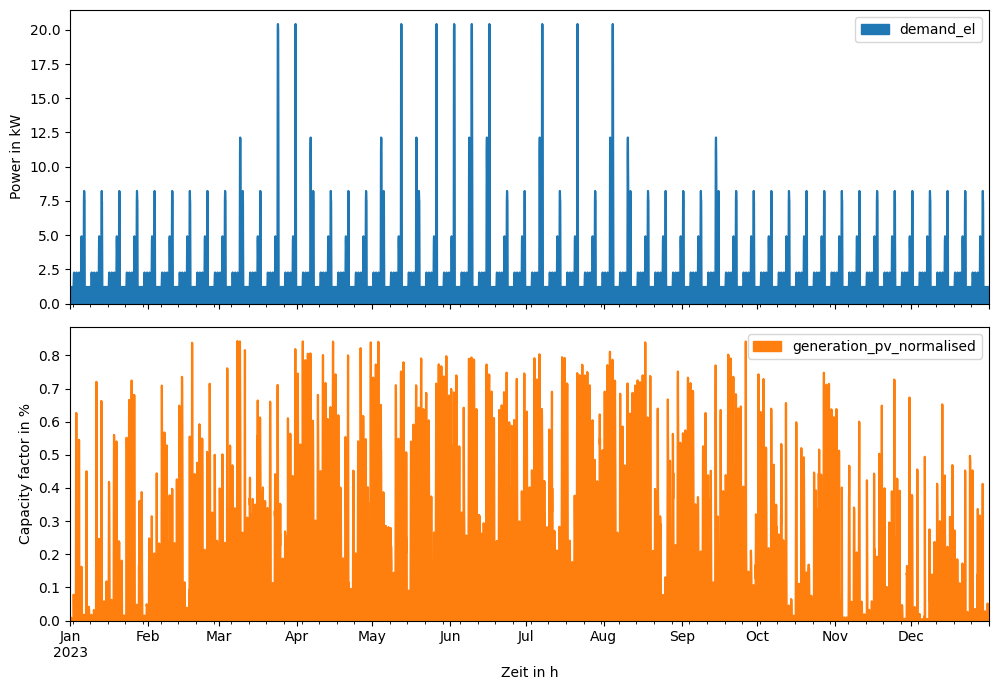

In [ ]:
pd.options.plotting.backend = "matplotlib"
ax = data.plot.area(subplots=True, figsize=(10, 7))

for subplot in ax:
    subplot.set_xlabel("Zeit in h")

ax[0].set_ylabel("Power in kW")
ax[1].set_ylabel("Capacity factor in %")

plt.tight_layout()

This first part of the example models the electricity system of a mountain hut in the Austrian alps (left side of the below schematic).

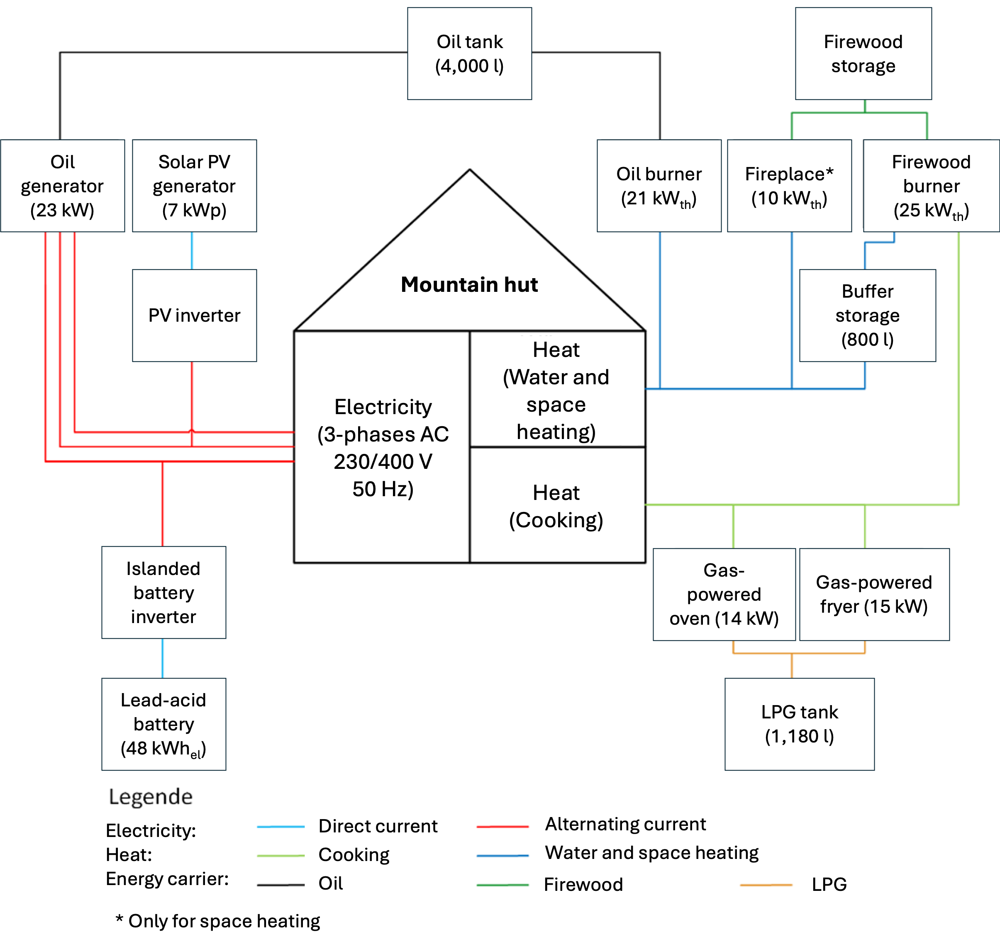

To do so, the necessary energy carriers are added as **buses**.

In [ ]:
energysystem.add("Bus", name="Elec")
energysystem.add("Bus", name="Oil")

in the next step, the energy generators are added.
* Existing solar PV modules: 7.04 kWp
* Existing oil generator: 23.2 kW<sub>el</sub>

In [ ]:
pv_power_exist = 7.04
energysystem.add(
    "Generator",
    name="PV_exist",
    bus="Elec",
    p_max_pu=data["generation_pv_normalised"],
    p_nom=pv_power_exist)

energysystem.add(
    "Link",
    name="Oil generator",
    bus0="Oil",
    bus1="Elec",
    efficiency=0.33,
    p_nom=23.2/0.33) #Conversion from kW(el) to kW(th-Energietraeger)

energysystem.add(
    "Generator",
    name="Crude oil",
    bus="Oil",
    p_nom_extendable=True,
    marginal_cost=0.08)

In [ ]:
energysystem.objective

2356.3045860294696

Now, the consumers of energy are added (= loads):
* Electricity consumption
* Excess electricity *(This is a virtual load necessary to maintain the energy balance of the system)*

In [ ]:
energysystem.add(
    "Load",
    name="Elec demand",
    bus="Elec",
    p_set=data["demand_el"])

energysystem.add(
    "Generator",
    name="Excess elec",
    bus="Elec",
    p_nom_extendable=True,
    sign=-1)

We can now create and solve the optimization problem.

In [ ]:
energysystem.optimize(solver_name="highs")

Index(['Oil generator'], dtype='object', name='Link')
Index(['Elec', 'Oil'], dtype='object', name='Bus')
Index(['Oil generator'], dtype='object', name='Link')
Index(['Elec', 'Oil'], dtype='object', name='Bus')
Writing continuous variables.: 100%|██████████| 3/3 [00:00<00:00, 39.51it/s]


('ok', 'optimal')

Let's have a look at our small energy system.

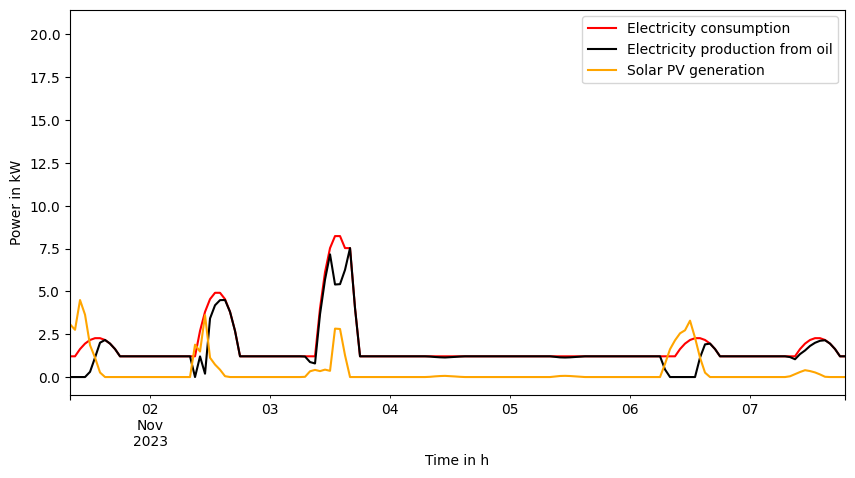

In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))
energysystem.loads_t.p[["Elec demand"]].plot(ax=ax, kind="line", color="red")
energysystem.links_t.p1[["Oil generator"]].mul(-1).plot(ax=ax, kind="line", color="black")
energysystem.generators_t.p[["PV_exist"]].plot(ax=ax, kind="line", color="orange")
ax.legend(["Electricity consumption", "Electricity production from oil", "Solar PV generation"])
ax.set_xlabel("Time in h")
ax.set_ylabel("Power in kW")
ax.set_xlim("2023-11-01 08:00:00", "2023-11-07 19:00:00")
plt.show()

Wonder how storage would change our system? Let's add one battery storage unit.
* Capacity: 40 kWh
* Minimal state of charge: 40 %
* Maximum state of charge: 80 %
* Efficiency of charging and discharging: 86 %

In [ ]:
energysystem.add("Bus", "Battery storage")

energysystem.add(
    "Store",
    name="Battery storage_Capacity",
    bus="Battery storage",
    e_nom=40,
    standing_loss=0.0001,
    e_initial=0.4*40,
    e_min_pu=0.4,
    e_max_pu=0.8)

energysystem.add(
    "Link",
    name="Battery storage_Charging",
    bus0="Elec",
    bus1="Battery storage",
    efficiency=0.86,
    p_nom=4)

energysystem.add(
    "Link",
    name="Battery storage_Discharging",
    bus0="Battery storage",
    bus1="Elec",
    efficiency=0.86,
    p_nom=4)

Again, we create and solve the optimization problem.

In [ ]:
energysystem.optimize(solver_name="highs")

Index(['Oil generator', 'Battery storage_Charging',
       'Battery storage_Discharging'],
      dtype='object', name='Link')
Index(['Elec', 'Oil', 'Battery storage'], dtype='object', name='Bus')
Index(['Battery storage_Capacity'], dtype='object', name='Store')
Index(['Oil generator', 'Battery storage_Charging',
       'Battery storage_Discharging'],
      dtype='object', name='Link')
Index(['Elec', 'Oil', 'Battery storage'], dtype='object', name='Bus')
Index(['Battery storage_Capacity'], dtype='object', name='Store')
Writing continuous variables.: 100%|██████████| 5/5 [00:00<00:00, 34.64it/s]


('ok', 'optimal')

Plot of the new solution with an integrated battery storage unit.

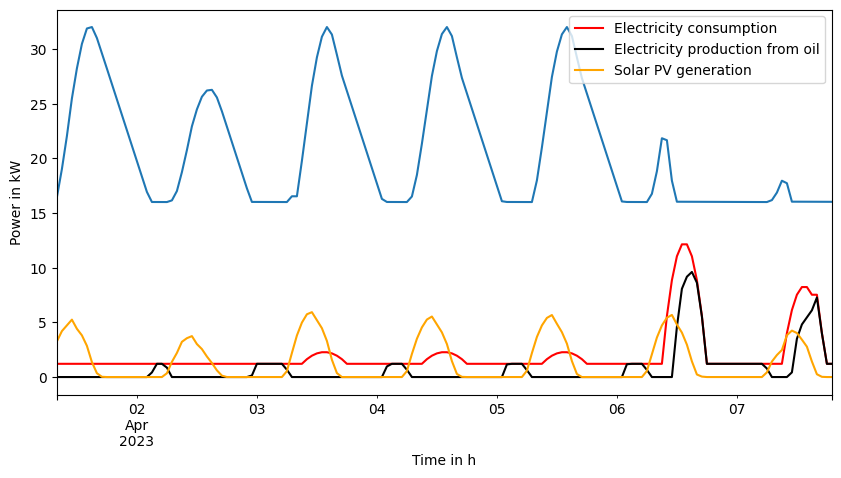

In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))
energysystem.loads_t.p[["Elec demand"]].plot(ax=ax, kind="line", color="red")
energysystem.links_t.p1[["Oil generator"]].mul(-1).plot(ax=ax, kind="line", color="black")
energysystem.generators_t.p[["PV_exist"]].plot(ax=ax, kind="line", color="orange")
energysystem.stores_t.e.plot(ax=ax, kind="line")
ax.legend(["Battery storage"])
ax.legend(["Electricity consumption", "Electricity production from oil", "Solar PV generation"])
ax.set_xlabel("Time in h")
ax.set_ylabel("Power in kW")
ax.set_xlim("2023-04-01 08:00:00", "2023-04-07 19:00:00")
plt.show()

Let's check the temporal behaviour of the battery's state of charge

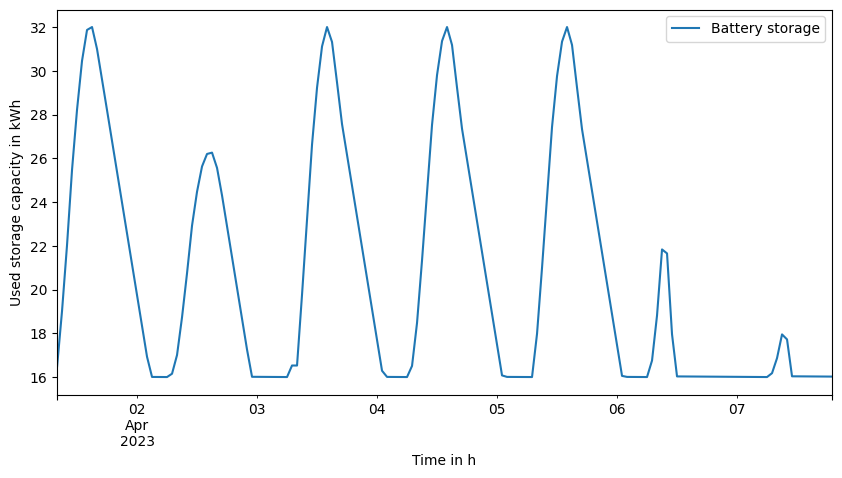

In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))
energysystem.stores_t.e.plot(ax=ax, kind="line")
ax.legend(["Battery storage"])
ax.set_xlabel("Time in h")
ax.set_ylabel("Used storage capacity in kWh")
ax.set_xlim("2023-04-01 08:00:00", "2023-04-07 19:00:00")
plt.show()

Let's see to what extend an increase in PV generation capacity is economically worthwile.

In [ ]:
energysystem.add(
    "Generator",
    name="PV_build",
    bus="Elec",
    p_max_pu=data["generation_pv_normalised"],
    p_nom_extendable=True,
    capital_cost=100) #fixed annual costs, including annuity and FOM

Create and solve the optimization problem.

In [ ]:
energysystem.optimize(solver_name="highs")

Index(['Oil generator', 'Battery storage_Charging',
       'Battery storage_Discharging'],
      dtype='object', name='Link')
Index(['Elec', 'Oil', 'Battery storage'], dtype='object', name='Bus')
Index(['Battery storage_Capacity'], dtype='object', name='Store')
Index(['Oil generator', 'Battery storage_Charging',
       'Battery storage_Discharging'],
      dtype='object', name='Link')
Index(['Elec', 'Oil', 'Battery storage'], dtype='object', name='Bus')
Index(['Battery storage_Capacity'], dtype='object', name='Store')
Writing continuous variables.: 100%|██████████| 5/5 [00:00<00:00, 27.48it/s]


('ok', 'optimal')

Plot: Addition of solar PV generation capacity

Text(0, 0.5, 'Power in kWp')

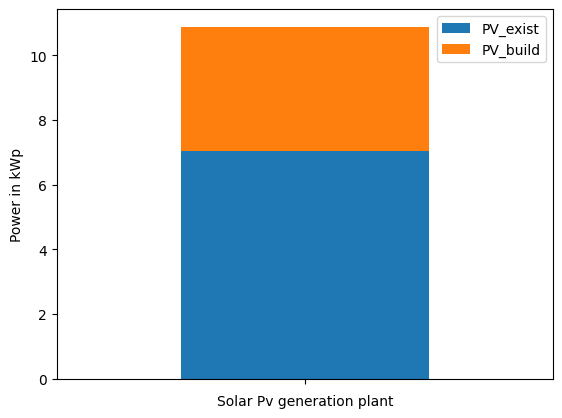

In [ ]:
data = {
    'PV_exist': pv_power_exist,
    'PV_build': energysystem.generators.p_nom_opt[["PV_build"]]["PV_build"]
    }
pv = pd.DataFrame(data, index=[""])
ax = pv.plot(kind='bar', stacked=True, legend=True)
ax.set_xlabel("Solar Pv generation plant")
ax.set_ylabel("Power in kWp")

In [ ]:
energysystem.statistics().round(1)

,,Optimal Capacity,Installed Capacity,Supply,Withdrawal,Energy Balance,Transmission,Capacity Factor,Curtailment,Capital Expenditure,Operational Expenditure,Revenue,Market Value
Generator,-,72.9,7.0,33968.8,196.4,33772.4,0.0,0.1,519627.0,384.6,1971.7,3060.3,0.1
Link,AC,78.3,78.3,13901.4,31353.4,-17452.0,31353.4,0.0,0.0,0.0,0.0,76.7,0.0
Load,-,0.0,0.0,0.0,16303.8,-16303.8,0.0,NaN,0.0,0.0,0.0,-3470.9,NaN
Store,AC,40.0,40.0,3092.2,3108.8,-16.6,0.0,0.5,0.0,0.0,0.0,333.9,0.1


<Axes: xlabel='snapshot'>

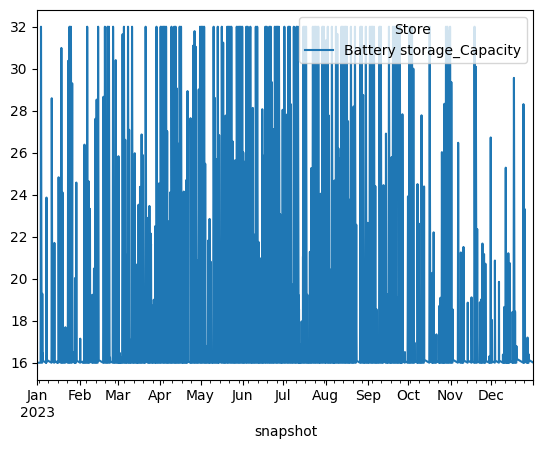

In [ ]:
energysystem.stores_t.e.plot(kind="line")

## LUNCH?

In the second part of this example, in addition to the electricity sector, we also consider heating (warm water and space heating) of the mountain hut (see area in the top-right part of below schematic).

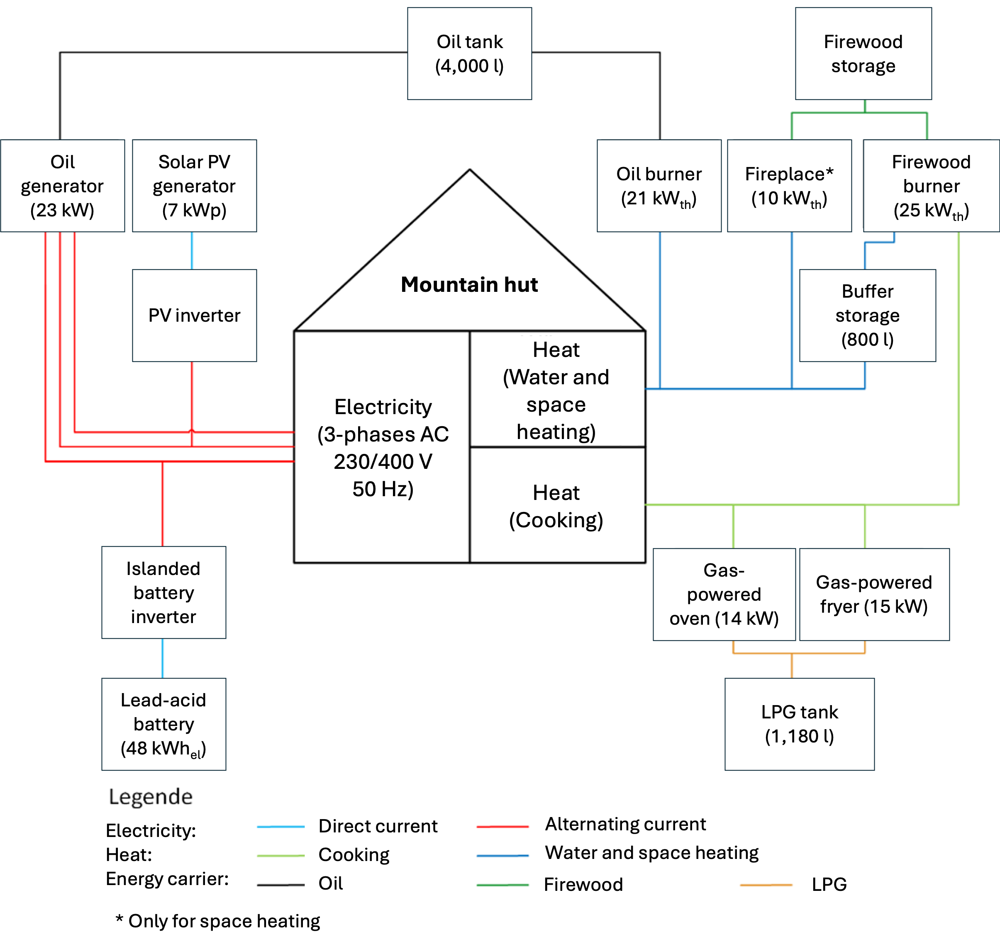

To achieve this, we define the additional energy carriers *heat* and *firewood*. We will also be using oil in the heating sector, but this carrier we have already defined in the electricity-only part.

In [ ]:
energysystem.add("Bus", name="Heat")
energysystem.add("Bus", name="Fire wood")

Importing time series data for heating: supply and demand.

In [ ]:
filename = f"https://raw.githubusercontent.com/AlexanderMeisinger/VL_ENS/main/Input_Waermedaten_Schutzhuette.csv"
data = pd.read_csv(filename, sep=";", decimal=",")
data = data.set_axis(date_time_index)

Check the time series of heating input data

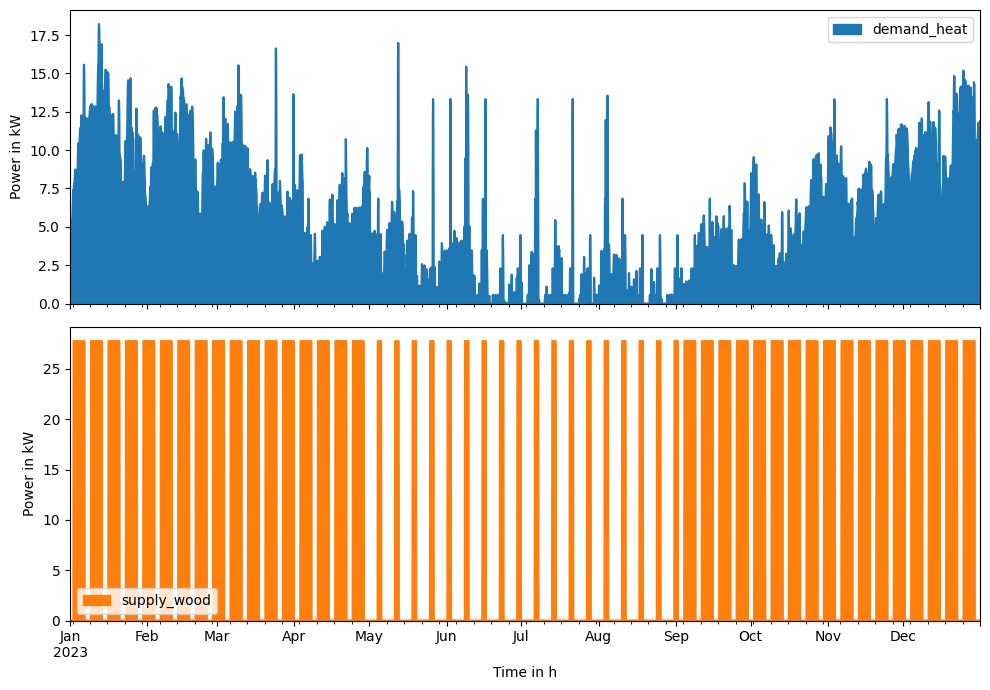

In [ ]:
ax = data.plot.area(subplots=True, figsize=(10, 7))

for subplot in ax:
    subplot.set_xlabel("Time in h")

ax[0].set_ylabel("Power in kW")
ax[1].set_ylabel("Power in kW")

plt.tight_layout()

Let's add new heat generation units: Oil burner and firewood oven.

In [ ]:
energysystem.add(
    "Link",
    name="Oil burner",
    bus0="Oil",
    bus1="Heat",
    efficiency=0.931,
    p_nom=21/0.931) #Conversion from kW(el) to kW(th)

energysystem.add(
    "Generator",
    name="Wood",
    bus="Fire wood",
    p_nom_extendable=True,
    marginal_cost=0.03)

energysystem.add(
    "Link",
    name="Fire wood burner",
    bus0="Fire wood",
    bus1="Heat",
    p_nom=25/0.9, #Conversion from kW(el) to kW(th-Energietraeger)
    p_set=data["supply_wood"], #Strict schedule by the mountain hut's CEO
    efficiency=0.9)

We add a thermal storage unit as well (think of it as a hot water storage tank).
* Capacity: 41.7 kWh<sub>th</sub> (equals 800 l of water)
* Standing loss: 0.13 % per hour
* Efficiency of charging and decharging: 99 %
* Maximum charging "power": 65 MW<sub>th</sub>


In [ ]:
energysystem.add("Bus", "Buffer storage")

energysystem.add(
    "Store",
    name="Buffer storage_capacity",
    bus="Buffer storage",
    e_nom=41.7, #kWh(th) equals 800 l of water
    standing_loss=0.0013)

energysystem.add(
    "Link",
    name="Buffer storage_charging",
    bus0="Heat",
    bus1="Buffer storage",
    efficiency=0.99,
    p_nom=65)

energysystem.add(
    "Link",
    name="Buffer storage_discharging",
    bus0="Buffer storage",
    bus1="Heat",
    efficiency=0.99,
    p_nom=65)

Add heat demand and virtual excess heat load.

In [ ]:
energysystem.add(
    "Load",
    name="Heat demand",
    bus="Heat",
    p_set=data["demand_heat"])

energysystem.add(
    "Generator",
    name="Excess heat",
    bus="Heat",
    p_nom_extendable=True,
    sign=-1)

Create and solve the optimization problem

In [ ]:
energysystem.optimize(solver_name="highs")

Index(['Elec', 'Oil', 'Battery storage', 'Heat', 'Fire wood',
       'Buffer storage'],
      dtype='object', name='Bus')
Index(['Battery storage_Capacity', 'Buffer storage_capacity'], dtype='object', name='Store')
Index(['Oil generator', 'Battery storage_Charging',
       'Battery storage_Discharging', 'Oil burner', 'Fire wood burner',
       'Buffer storage_charging', 'Buffer storage_discharging'],
      dtype='object', name='Link')
Index(['Elec', 'Oil', 'Battery storage', 'Heat', 'Fire wood',
       'Buffer storage'],
      dtype='object', name='Bus')
Index(['Battery storage_Capacity', 'Buffer storage_capacity'], dtype='object', name='Store')
Index(['Oil generator', 'Battery storage_Charging',
       'Battery storage_Discharging', 'Oil burner', 'Fire wood burner',
       'Buffer storage_charging', 'Buffer storage_discharging'],
      dtype='object', name='Link')
Writing continuous variables.: 100%|██████████| 5/5 [00:00<00:00, 15.83it/s]


('ok', 'optimal')

Plot of updated energy system

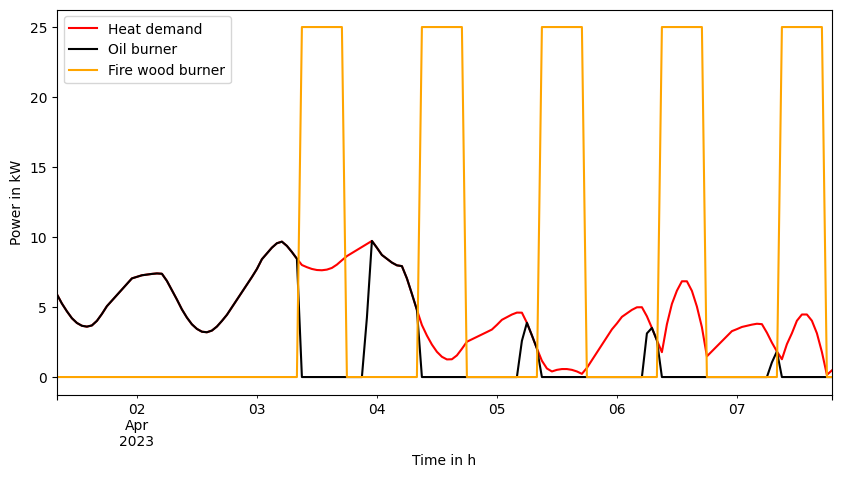

In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))
energysystem.loads_t.p[["Heat demand"]].plot(ax=ax, kind="line", color="red")
energysystem.links_t.p1[["Oil burner"]].mul(-1).plot(ax=ax, kind="line", color="black")
energysystem.links_t.p1[["Fire wood burner"]].mul(-1).plot(ax=ax, kind="line", color="orange")
ax.legend(["Heat demand", "Oil burner", "Fire wood burner"])
ax.set_xlabel("Time in h")
ax.set_ylabel("Power in kW")
ax.set_xlim("2023-04-01 08:00:00", "2023-04-07 19:00:00")
plt.show()

Let's have a look at the behavior of the buffer tank.

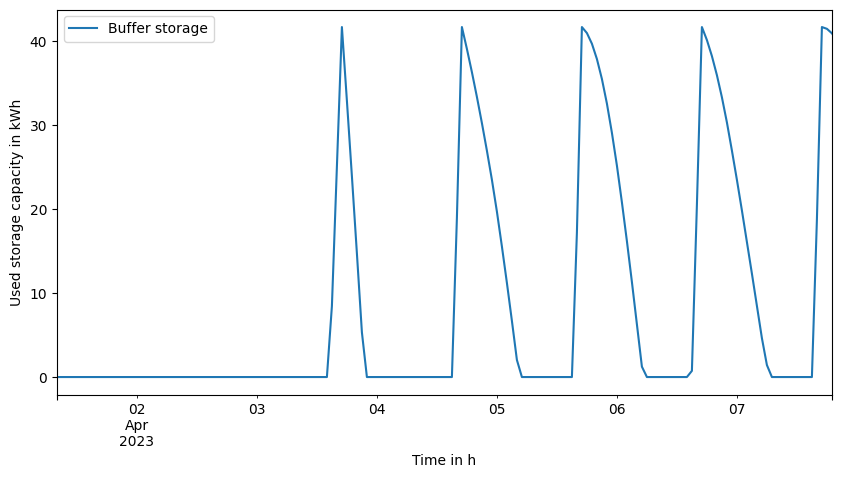

In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))
energysystem.stores_t.e["Buffer storage_capacity"].plot(ax=ax, kind="line")
ax.legend(["Buffer storage"])
ax.set_xlabel("Time in h")
ax.set_ylabel("Used storage capacity in kWh")
ax.set_xlim("2023-04-01 08:00:00", "2023-04-07 19:00:00")
plt.show()

How would it look like when using LPG (Liquified Petroleum Gas)? Try to add it similarily to the above example with oil and firewood. Have fun!

### 🗃️ Data in the PyPSA Object

Let us grab a PyPSA network of Egypt. It contains the current status of the Egyptian energy system.

Import the `network` to an object called `network`

In [2]:
import yaml
import pypsa
import warnings
import matplotlib.pyplot as plt
import geopandas as gpd
import numpy as np
import pandas as pd
from pathlib import Path
import seaborn as sns
from datetime import datetime
from cartopy import crs as ccrs
from pypsa.plot import add_legend_circles, add_legend_lines, add_legend_patches
import os
import xarray as xr
import cartopy
import glob
import logging

In [11]:
# @title Download prepared networks
# @markdown We have prepared a case study that can be explored in this notebook. To allow users to interact with the data we have prepared a pre-solved network, since running this optimization is a computationally expensive task.
# @markdown    * `network.nc`: The solved network
# @markdown   * `country_shapes.geojson`: The geographic shape of our modeled region
# @markdown   * `gadm_shapes.geojson`: The administrative regions which we are using to cluster the country
# @markdown   * `profile_solar.nc`: Spatially and temporally resolved solar PV availability
# @markdown   * `profile_wind.nc`: Spatially and temporally resolved wind availability
# @markdown   * `config.yaml`: The main input file with all the settings of the model run

# pd.options.plotting.backend = "plotly"

from urllib.request import urlretrieve

urls = {
    "network.nc" : "https://drive.usercontent.google.com/download?id=1CGG71DlzVG4rsQ8TjUL6dVfHk0pZcJpB&export=download",
    "country_shapes.geojson" : "https://drive.usercontent.google.com/download?id=1rB8aVhcUPUTbrI1SP-hqNPNILdL2MNLa&export=download",
    "gadm_shapes.geojson" : "https://drive.usercontent.google.com/download?id=1_kWz6L3W9to3LTLq9TnquEMkaBGT_vgJ&export=download",
    "profile_solar.nc" : "https://drive.usercontent.google.com/download?id=15dI5S38TQEvKliRJm7rvIAYIDnWth_0Q&export=download",
    "profile_wind.nc" : "https://drive.usercontent.google.com/download?id=10SBZ7LPgQKcQZ8Fp3k0Ob2W-hE_kJmZm&export=download",
    "config.yaml" : "https://drive.usercontent.google.com/download?id=1kNcGN-3S6XH_xIdPfqFCJjsU3SaCq52Q&export=download",
    }


for name, url in urls.items():
    print(f"Retrieving {name} from Google Drive")
    urlretrieve(url, name)
print("Done")

Retrieving network.nc from Google Drive
Retrieving country_shapes.geojson from Google Drive
Retrieving gadm_shapes.geojson from Google Drive
Retrieving profile_solar.nc from Google Drive
Retrieving profile_wind.nc from Google Drive
Retrieving config.yaml from Google Drive
Done


Import the network and additional data

In [ ]:
network = pypsa.Network("/Users/marcoschamel/git-marco/pypsa-earth/results/KENYA/postnetworks/elec_s_2_ec_lcopt_Co2L0.00-3H_3H_2050_0.071_NZ_0export.nc")

Index(['H2 pipeline KE.10_1_AC -> KE.25_1_DC'], dtype='object', name='name')
INFO:pypsa.io:Imported network elec_s_2_ec_lcopt_Co2L0.00-3H_3H_2050_0.071_NZ_0export.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [4]:
# network = pypsa.Network('network.nc', warnings='ignore', engine='netcdf4')
gadm_shapes = gpd.read_file('gadm_shapes.geojson')
regions_onshore = gpd.read_file('country_shapes.geojson')
country_coordinates = regions_onshore.total_bounds[[0, 2, 1, 3]]
with open('config.yaml', "r") as f:
    cfg = yaml.safe_load(f)

/opt/miniconda3/envs/pypsa-earth/lib/python3.11/site-packages/pyogrio/__init__.py:7: DeprecationWarning: The 'shapely.geos' module is deprecated, and will be removed in a future version. All attributes of 'shapely.geos' are available directly from the top-level 'shapely' namespace (since shapely 2.0.0).
  import shapely.geos  # noqa: F401


Inspect the data in the network.

_All data in a PyPSA model is stored as pandas DataFrames, allowing you to apply any standard pandas operations directly to PyPSA network components._

In [5]:
# Check the number of geographic buses (-> regions)
len(network.buses.location.unique())

34

Check the shape of our region

<Axes: >

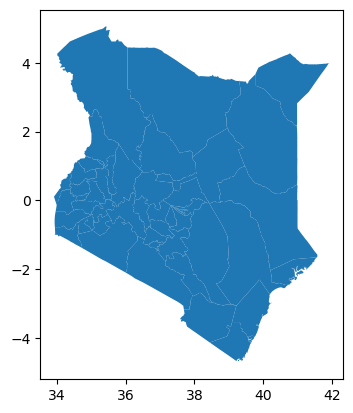

In [6]:
gadm_shapes.plot()

In [7]:
network.buses.head()

,v_nom,tag_substation,tag_area,lon,lat,country,carrier,x,y,control,generator,location,unit,type,v_mag_pu_set,v_mag_pu_min,v_mag_pu_max,sub_network
Bus,,,,,,,,,,,,,,,,,,
KE.10_1_AC,380.0,transmission,0.0,36.595000,-1.418500,KE,AC,36.595000,-1.418500,Slack,KE.10_1_AC onwind,KE.10_1_AC,MWh,,1.0,0.0,inf,
KE.11_1_AC,380.0,transmission,0.0,34.614450,0.407700,KE,AC,34.614450,0.407700,PQ,,KE.11_1_AC,MWh,,1.0,0.0,inf,
KE.12_1_AC,380.0,transmission,0.0,35.158200,-0.349950,KE,AC,35.158200,-0.349950,PQ,,KE.12_1_AC,MWh,,1.0,0.0,inf,
KE.13_1_AC,380.0,transmission,0.0,36.956120,-1.125940,KE,AC,36.956120,-1.125940,PQ,,KE.13_1_AC,MWh,,1.0,0.0,inf,
KE.14_1_AC,380.0,transmission,0.0,39.696814,-3.677029,KE,AC,39.696814,-3.677029,PQ,,KE.14_1_AC,MWh,,1.0,0.0,inf,


In [8]:
network.generators.head()

,carrier,bus,p_nom_min,p_nom,p_nom_extendable,efficiency,marginal_cost,capital_cost,p_nom_max,weight,...,shut_down_cost,stand_by_cost,min_up_time,min_down_time,up_time_before,down_time_before,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down
Generator,,,,,,,,,,,,,,,,,,,,,
KE.10_1_AC onwind,onwind,KE.10_1_AC,9.798089,9.798089,True,1.0,0.024920,109295.569252,5.817325e+04,2584.533708,...,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
KE.10_1_AC solar,solar,KE.10_1_AC,26.749565,26.749565,True,1.0,0.020793,29345.796278,8.619071e+04,13446.797814,...,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
KE.11_1_AC onwind,onwind,KE.11_1_AC,0.155360,0.155360,True,1.0,0.024380,109295.569252,4.674389e+03,50.422898,...,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
KE.11_1_AC solar,solar,KE.11_1_AC,3.056794,3.056794,True,1.0,0.019412,29345.796278,9.581218e+03,1535.990726,...,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
KE.12_1_AC CCGT,CCGT,KE.12_1_AC,60.000000,60.000000,False,0.5,47.210034,84469.122809,inf,1.000000,...,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0


Check the time series of generators

In [9]:
network.generators_t.p_max_pu.iloc[:, 0:5].head()

Generator,KE.10_1_AC onwind,KE.10_1_AC residential rural solar thermal collector,KE.10_1_AC residential urban decentral solar thermal collector,KE.10_1_AC services rural solar thermal collector,KE.10_1_AC services urban decentral solar thermal collector
snapshot,,,,,
2013-01-01 00:00:00,0.0,0.000000,0.000000,0.000000,0.000000
2013-01-01 03:00:00,0.0,0.000000,0.000000,0.000000,0.000000
2013-01-01 06:00:00,0.0,0.127342,0.127342,0.127342,0.127342
2013-01-01 09:00:00,0.0,0.310154,0.310154,0.310154,0.310154
2013-01-01 12:00:00,0.0,0.302531,0.302531,0.302531,0.302531


Extract specific generators, for example one solar and one wind turbine.

Please not that due to the 24H resolution of the network, the classic daily solar curve is not visible.

Running the model in 3H or 1H resolution is no problem however, it just takes too much disc space for this introduction.

<Axes: xlabel='snapshot'>

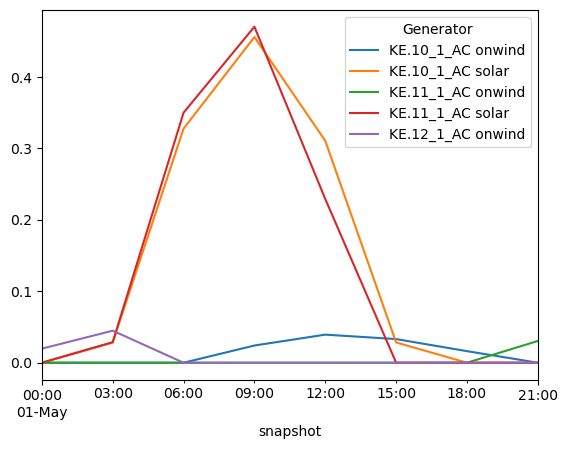

In [34]:
gen_mask = network.generators[
    (network.generators.carrier == 'solar') | (network.generators.carrier == 'onwind')
]
gen_mask.index
network.generators_t.p_max_pu.loc['2013-05-1', gen_mask.index[0:5]].plot()

Check the links

In [11]:
network.links.head()

,num_parallel,v_nom,bus0,bus1,length,dc,geometry,bounds,carrier,s_max_pu,...,start_up_cost,shut_down_cost,min_up_time,min_down_time,up_time_before,down_time_before,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down
Link,,,,,,,,,,,,,,,,,,,,,
86+4,NaN,NaN,KE.10_1_AC,KE.25_1_DC,716.134435,NaN,NaN,NaN,DC,NaN,...,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
co2 vent,NaN,NaN,co2 stored,co2 atmosphere,0.000000,NaN,NaN,NaN,co2 vent,NaN,...,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
KE.10_1_AC OCGT,NaN,NaN,KE.10_1_AC gas,KE.10_1_AC,0.000000,NaN,NaN,NaN,OCGT,NaN,...,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
KE.11_1_AC OCGT,NaN,NaN,KE.11_1_AC gas,KE.11_1_AC,0.000000,NaN,NaN,NaN,OCGT,NaN,...,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
KE.12_1_AC OCGT,NaN,NaN,KE.12_1_AC gas,KE.12_1_AC,0.000000,NaN,NaN,NaN,OCGT,NaN,...,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0


Check the transmission lines

In [12]:
network.lines.head()

,num_parallel,v_nom,bus0,bus1,length,dc,geometry,bounds,carrier,type,...,build_year,lifetime,terrain_factor,v_ang_min,v_ang_max,sub_network,x_pu,r_pu,g_pu,b_pu
Line,,,,,,,,,,,,,,,,,,,,,
0,0.578947,380.0,KE.10_1_AC,KE.13_1_AC,64.588611,False,"MULTILINESTRING ((36.356 -1.0648, 36.356714299...","MULTIPOINT ((36.356 -1.0648), (36.717711499999...",AC,Al/St 240/40 4-bundle 380.0,...,0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
1,2.105263,380.0,KE.10_1_AC,KE.14_1_AC,532.944827,False,"MULTILINESTRING ((36.833 -1.7732, 36.833287099...","MULTIPOINT ((36.833 -1.7732), (36.833287099999...",AC,Al/St 240/40 4-bundle 380.0,...,0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
10,0.086842,380.0,KE.12_1_AC,KE.32_1_AC,81.535080,False,"MULTILINESTRING ((35.1513 -0.2113, 35.15136489...","MULTIPOINT ((35.1513 -0.2113), (35.15136489999...",AC,Al/St 240/40 4-bundle 380.0,...,0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
11,0.086842,380.0,KE.13_1_AC,KE.22_1_AC,56.267611,False,"MULTILINESTRING ((37.1265 -1.1636, 37.12653140...","MULTIPOINT ((37.1265 -1.1636), (37.8125328 -0....",AC,Al/St 240/40 4-bundle 380.0,...,0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
12,0.665789,380.0,KE.13_1_AC,KE.30_1_AC,28.619956,False,"LINESTRING (36.915 -1.2589, 36.90596459999996 ...","MULTIPOINT ((36.915 -1.2589), (37.1265 -1.1636))",AC,Al/St 240/40 4-bundle 380.0,...,0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0


Check the attached loads

In [13]:
network.loads.head()

,bus,carrier,p_set,type,q_set,sign
Load,,,,,,
KE.10_1_AC,KE.10_1_AC low voltage,AC,0.0,,0.0,-1.0
KE.11_1_AC,KE.11_1_AC low voltage,AC,0.0,,0.0,-1.0
KE.12_1_AC,KE.12_1_AC low voltage,AC,0.0,,0.0,-1.0
KE.13_1_AC,KE.13_1_AC low voltage,AC,0.0,,0.0,-1.0
KE.14_1_AC,KE.14_1_AC low voltage,AC,0.0,,0.0,-1.0


To find out, which code represents which region, you can create an interactive map of the used shapes..

In [14]:
gadm_shapes.explore()

... or you can pick one region by itself

<Axes: >

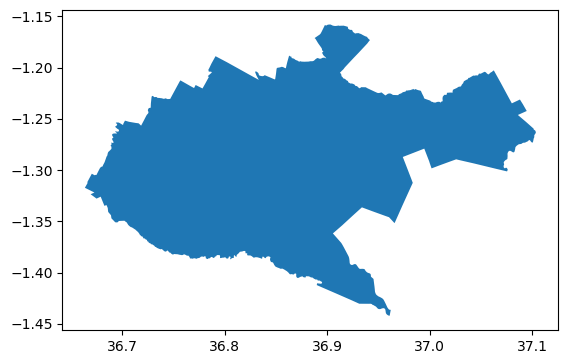

In [15]:
id = 'KE.30_1' # Nairobi Governorate
gadm_shapes[gadm_shapes.GADM_ID == id].plot()

### 🖼 Plotting the network

Map carriers to better names and colors.

In [16]:
n = network.copy()
missing_carriers = [
    'lignite', 'coal', 'solar rooftop', 'oil', 'gas',
    'residential rural solar thermal',
    'residential urban decentral solar thermal',
    'services rural solar thermal',
    'services urban decentral solar thermal',
    'urban central solar thermal',
    'ccgt'
]

carrier_color_mapping = {
    'lignite': 'coal',
    'solar rooftop': 'solar',
    'residential rural solar thermal': 'solar',
    'residential urban decentral solar thermal': 'solar',
    'services rural solar thermal': 'solar',
    'services urban decentral solar thermal': 'solar',
    'urban central solar thermal': 'solar',
    'ccgt': 'gas'
}

# Assign colors for missing carriers
for c, ref in carrier_color_mapping.items():
    n.carriers.loc[c, 'color'] = n.carriers.loc[ref, 'color']

# Set nice_names
n.carriers.loc['coal', 'nice_name'] = 'Coal'
n.carriers.loc['oil', 'nice_name'] = 'Oil'
n.carriers.loc['ccgt', 'nice_name'] = 'Gas'

for c, ref in carrier_color_mapping.items():
    if c not in ['ccgt']:  # ccgt already has its own name
        n.carriers.loc[c, 'nice_name'] = n.carriers.loc[ref, 'nice_name']

Map the current energy system

/opt/miniconda3/envs/pypsa-earth/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


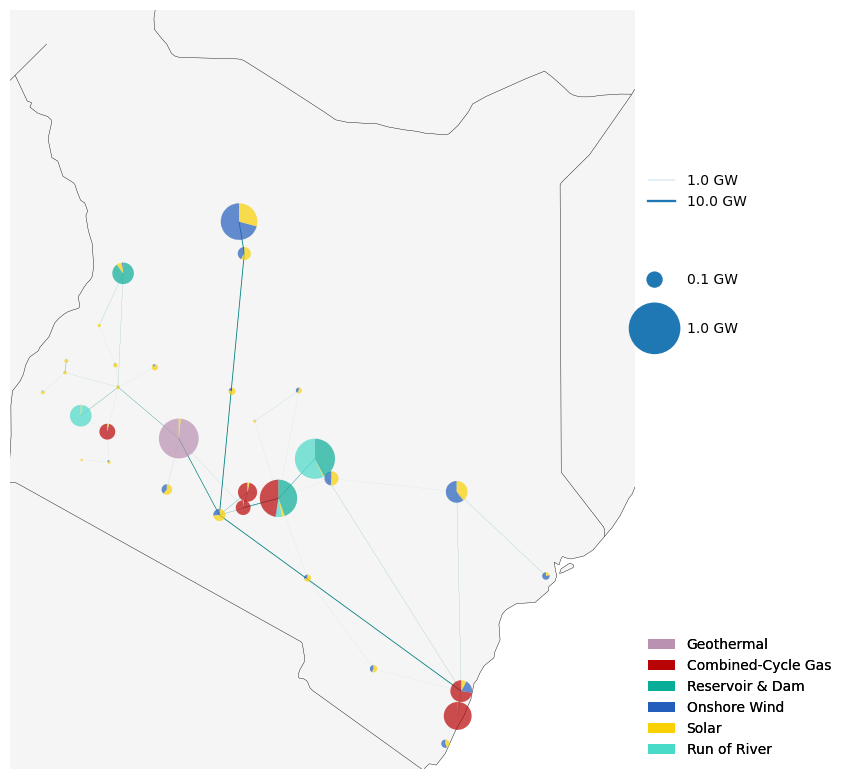

In [33]:
# --- Scale settings ---
bus_scale = 6e3
line_scale = 6e3

# --- Legend settings ---
bus_sizes = [100, 1000]  # in MW
line_sizes = [1000, 10000]  # in MW

# --- Remove "Load" carrier for plotting ---
if "Load" in n.carriers.index:
    n.carriers.drop("Load", inplace=True)

# --- Aggregate generator and storage capacities by bus and carrier ---
gen = n.generators[n.generators.carrier != "load"].groupby(["bus", "carrier"]).p_nom.sum()
sto = n.storage_units.groupby(["bus", "carrier"]).p_nom.sum()
buses = pd.concat([gen, sto])

# --- Plotting ---
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={"projection": ccrs.PlateCarree()})

# --- Filter Links: only those that lie within GADM regions ---
# Extract the base part of the bus names
link_bus0_base = n.links.bus0.str.split("_AC").str[0]
link_bus1_base = n.links.bus1.str.split("_AC").str[0]

# Keep only links whose both ends are present in the GADM shapes
valid_links = n.links[
    link_bus0_base.isin(gadm_shapes.index) &
    link_bus1_base.isin(gadm_shapes.index) &
    (n.links.p_nom > 0)  # optional: only positive capacity
]

# overwrite temporarily for the plot
links_backup = n.links
n.links = valid_links

with plt.rc_context({"patch.linewidth": 0.}):
    n.plot(
        bus_sizes=buses / bus_scale,
        bus_alpha=0.7,
        line_widths=n.lines.s_nom / line_scale,
        link_widths=n.links.p_nom / line_scale,
        line_colors="teal",
        ax=ax,
        margin=0.2,
        #color_geomap=None,
        color_geomap={'ocean': 'white', 'land': 'whitesmoke'}
    )

# regions_onshore.plot(
#     ax=ax,
#     facecolor="whitesmoke",
#     edgecolor="white",
#     aspect="equal",
#     transform=ccrs.PlateCarree(),
#     linewidth=0,
# )

#gadm_shapes.boundary.plot(ax=ax, edgecolor="lightgrey", linewidth=0.5)

# Set map extent
bounds = regions_onshore.total_bounds.copy()
pad_x = 2
bounds[2] += pad_x
# Extend above
pad_y = 8
bounds[3] += pad_y
bounds[1] -= 0.5*pad_y
ax.set_extent(bounds[[0, 2, 1, 3]])
ax.set_extent(regions_onshore.total_bounds[[0, 2, 1, 3]])

# --- Add legends ---
legend_kwargs = {"loc": "upper left", "frameon": False}
legend_circles_dict = {"bbox_to_anchor": (1, 0.67), "labelspacing": 2.5, **legend_kwargs}

add_legend_circles(
    ax,
    [s / bus_scale for s in bus_sizes],
    [f"{s / 1000} GW" for s in bus_sizes],
    legend_kw=legend_circles_dict,
)
add_legend_lines(
    ax,
    [s / line_scale for s in line_sizes],
    [f"{s / 1000} GW" for s in line_sizes],
    legend_kw={"bbox_to_anchor": (1, 0.8), **legend_kwargs},
)

# --- Create patch legend for carriers (unique nice_name, non-zero capacity) ---
colors_legend = []
labels_legend = []
seen = set()
for c in n.carriers.index:
    name = n.carriers.loc[c, 'nice_name']
    color = n.carriers.loc[c, 'color']

    # Sum capacity over all buses for this carrier
    if c in buses.index.get_level_values('carrier'):
        val_total = buses.xs(c, level='carrier').sum()
    else:
        val_total = 0

    if name not in seen and val_total > 0:
        seen.add(name)
        colors_legend.append(color)
        labels_legend.append(name)

add_legend_patches(
    ax,
    colors_legend,
    labels_legend,
    legend_kw={"bbox_to_anchor": (1, 0), **legend_kwargs, "loc": "lower left"},
)

fig.tight_layout()
plt.show()

# Restore original links
n.links = links_backup

Plot the capacity in a pie chart

Text(0.5, 1.0, 'Generator Capacity by Carrier (GW)')

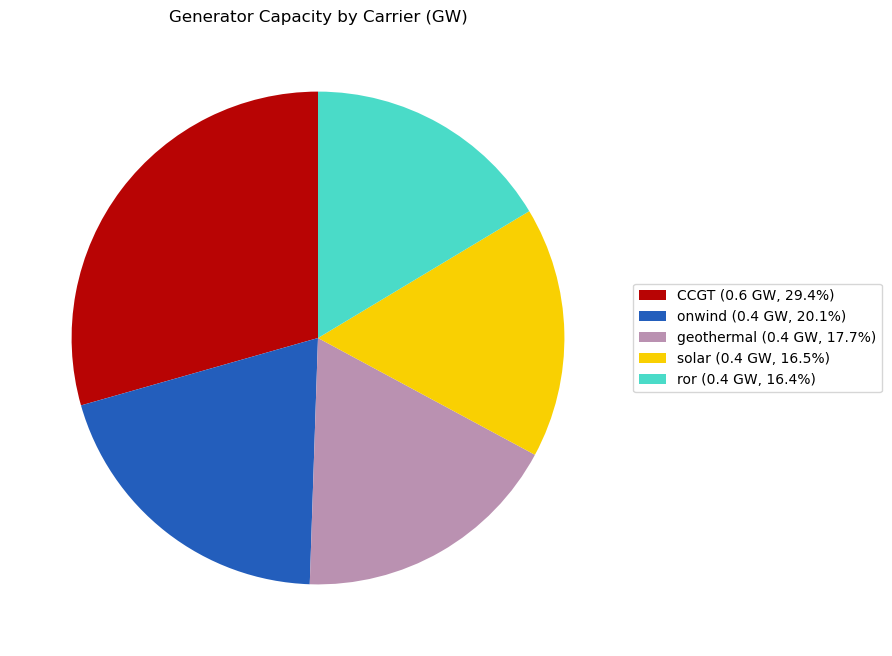

In [18]:
# --- Extract data for current energy carriers ---
generator_capacity_by_carrier = (
    n.generators[~n.generators.carrier.str.contains("load", case=False)]
    .groupby("carrier")
    .p_nom.sum()
    .div(1e3)  # Convert to GW
    .sort_values(ascending=False)
)
# --- Filter: keep only entries > 0 ---
generator_capacity_by_carrier = generator_capacity_by_carrier[generator_capacity_by_carrier > 0]

plt.figure(figsize=(8, 8))
wedges, _ = plt.pie(
    generator_capacity_by_carrier,
    labels=None,   # no labels directly in the chart
    startangle=90,
    colors=n.carriers[
            n.carriers.index.isin(generator_capacity_by_carrier.index)
        ].color.reindex(generator_capacity_by_carrier.index)
)
# Legend with capacity + share
labels = [
    f"{c} ({v:.1f} GW, {100*v/generator_capacity_by_carrier.sum():.1f}%)"
    for c, v in zip(generator_capacity_by_carrier.index, generator_capacity_by_carrier.values)
]
plt.legend(
    wedges,
    labels,
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)
)
plt.title("Generator Capacity by Carrier (GW)")

Map the future energy system

In [19]:
mask_name = n.carriers["nice_name"].isna() | (n.carriers["nice_name"] == "")
n.carriers.loc[mask_name, "nice_name"] = n.carriers.index[mask_name].str.capitalize()

mask_color = n.carriers["color"].isna() | (n.carriers["color"] == "")
n.carriers.loc[mask_color, "color"] = "gray"

/opt/miniconda3/envs/pypsa-earth/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


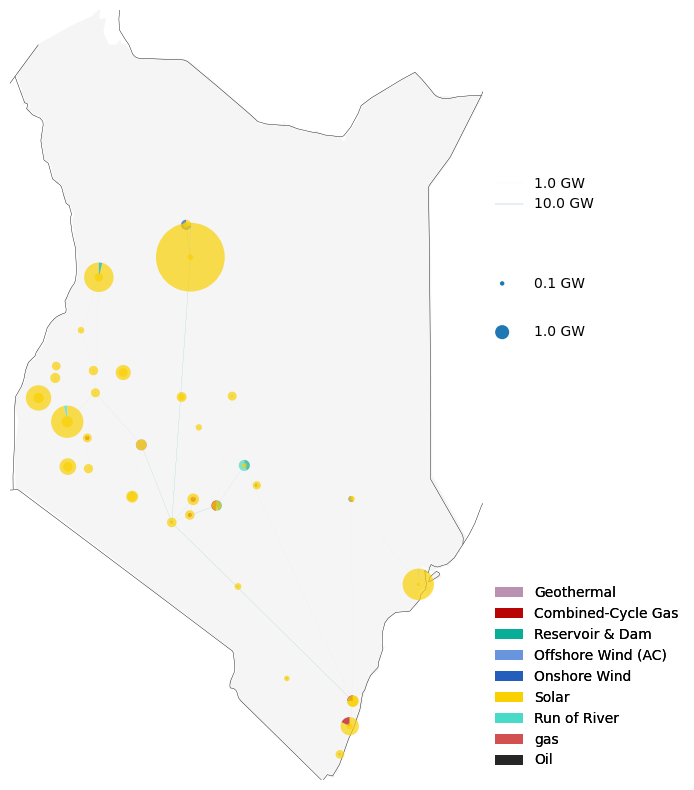

In [20]:
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={"projection": ccrs.EqualEarth()})
# --- Aggregate capacities ---
gen = n.generators[n.generators.carrier != "load"].groupby(["bus", "carrier"]).p_nom_opt.sum()
sto = n.storage_units.groupby(["bus", "carrier"]).p_nom_opt.sum()
buses = pd.concat([gen, sto])

# --- Filter links ---
link_bus0_base = n.links.bus0.str.split("_AC").str[0]
link_bus1_base = n.links.bus1.str.split("_AC").str[0]
valid_links = n.links[
    link_bus0_base.isin(gadm_shapes.index) &
    link_bus1_base.isin(gadm_shapes.index) &
    (n.links.p_nom_opt > 0)
]
links_backup = n.links
n.links = valid_links

with plt.rc_context({"patch.linewidth": 0.}):
    n.plot(
        bus_sizes=buses / bus_scale,
        bus_alpha=0.7,
        line_widths=n.lines.s_nom_opt / line_scale,
        link_widths=n.links.p_nom_opt / line_scale,
        line_colors="teal",
        ax=ax,
        margin=0.2,
        color_geomap=None,
    )

regions_onshore.plot(
    ax=ax,
    facecolor="whitesmoke",
    edgecolor="white",
    aspect="equal",
    transform=ccrs.PlateCarree(),
    linewidth=0,
)

# Zoom the map
ax.set_extent(regions_onshore.total_bounds[[0, 2, 1, 3]])

# Restore original links
n.links = links_backup

# --- Add legends ---
legend_kwargs = {"loc": "upper left", "frameon": False}
legend_circles_dict = {"bbox_to_anchor": (1, 0.67), "labelspacing": 2.5, **legend_kwargs}

add_legend_circles(
    ax,
    [s / bus_scale for s in bus_sizes],
    [f"{s / 1000} GW" for s in bus_sizes],
    legend_kw=legend_circles_dict,
)
add_legend_lines(
    ax,
    [s / line_scale for s in line_sizes],
    [f"{s / 1000} GW" for s in line_sizes],
    legend_kw={"bbox_to_anchor": (1, 0.8), **legend_kwargs},
)
# --- Create patch legend for carriers (unique nice_name, non-zero capacity) ---
colors_legend = []
labels_legend = []
seen = set()
for c in n.carriers.index:
    name = n.carriers.loc[c, 'nice_name']
    color = n.carriers.loc[c, 'color']

    # Sum capacity over all buses for this carrier
    if c in buses.index.get_level_values('carrier'):
        val_total = buses.xs(c, level='carrier').sum()
    else:
        val_total = 0

    if name not in seen and val_total > 0:
        seen.add(name)
        colors_legend.append(color)
        labels_legend.append(name)

add_legend_patches(
    ax,
    colors_legend,
    labels_legend,
    legend_kw={"bbox_to_anchor": (1, 0), **legend_kwargs, "loc": "lower left"},
)
fig.tight_layout()

Plot the capacity extension as bar chart

<Axes: title={'center': 'Generator capacity expansion in GW'}, xlabel='carrier'>

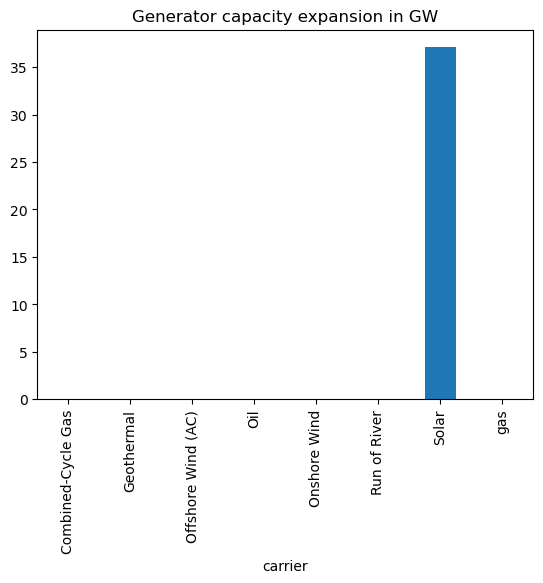

In [21]:
optimal_capacity = n.statistics.optimal_capacity(comps=["Generator"]).droplevel(0).div(1e3)
installed_capacity = n.statistics.installed_capacity(comps=["Generator"]).droplevel(0).div(1e3)
generation_capacity_expansion = optimal_capacity - installed_capacity
generation_capacity_expansion.drop(["load"], inplace=True)
generation_capacity_expansion.plot.bar(title="Generator capacity expansion in GW")

Analyse the future energy balance

In [49]:
# Rename columns for better readability
rename_cols = {
    "-": "Load",
    "load": "load shedding",
}

# Calculate the energy balance, aggregate by carrier, and convert MWh to TWh
energy_balance = (
    n.statistics.energy_balance()
    #.loc[:, :, :]
    .loc[:, :, "AC"] # nur Stromsystem
    .groupby("carrier")
    .sum()
    .div(1e6)  # Convert MWh to TWh
    .to_frame()
    .T
    .rename(columns=rename_cols)
)

# Remove carriers with no energy flow
energy_balance = energy_balance.loc[:, (energy_balance != 0).any(axis=0)]

colors = {key.lower(): value.lower() for key, value in cfg["plotting"]["tech_colors"].items()}
nice_names = {value.lower(): key for key, value in cfg["plotting"]["nice_names"].items()}


# color-matching
color_list = []
for col in energy_balance.columns:
    original_name = col.lower()
    key_name = nice_names.get(original_name, original_name)
    color = colors.get(key_name.lower(), 'gray')
    color_list.append(color)

pd.options.plotting.backend = "matplotlib"

fig, ax = plt.subplots()
energy_balance.plot.bar(stacked=True, ax=ax, title="Energy Balance in TWh", color=color_list)
handles, labels = ax.get_legend_handles_labels()
nice_labels = [cfg["plotting"]["nice_names"].get(label, label) for label in energy_balance.columns]
ax.legend(handles, nice_labels, bbox_to_anchor=(1, 0), loc="lower left", title=None, ncol=1)

plt.show()

KeyError: 'AC'

Map PV- and Wind potentials

In [40]:
os.getcwd()

'/Users/marcoschamel/git-marco/pypsa-earth-docu/notebooks'

In [46]:
# solar = xr.open_dataset('profile_solar.nc')
# wind = xr.open_dataset('profile_wind.nc')

solar = xr.open_dataset('../../pypsa-earth/resources/Kenya_geo_pot/renewable_profiles/profile_solar.nc')
wind = xr.open_dataset('../../pypsa-earth/resources/Kenya_geo_pot/renewable_profiles/profile_onwind.nc')

def plot_voronoi(n, carrier, voronoi, cmap, projection, title=None, filename=None):
    g = n.generators.loc[n.generators.carrier == carrier]
    # br = gpd.read_file('country_shapes.geojson').set_index("name")
    br = gpd.read_file('../../pypsa-earth/resources/Kenya_geo_pot/shapes/country_shapes.geojson').set_index("name")
    br_area = br.to_crs("ESRI:54009")
    br_area = br_area.geometry.area * 1e-6
    br["p_nom_max"] = g.groupby("bus").sum().p_nom_max / br_area

    fig, ax = plt.subplots(figsize=(8, 4), subplot_kw={"projection": projection})
    plt.rcParams.update({"font.size": 10})
    br.plot(
        ax=ax,
        column="p_nom_max",
        transform=ccrs.PlateCarree(),
        linewidth=0.25,
        edgecolor="k",
        cmap=cmap,
        vmin=0,
        vmax=br["p_nom_max"].max(),
        legend=True,
        legend_kwds={"label": r"potential density"},
    )
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS.with_scale("110m"))
    ax.set_extent(country_coordinates, crs=ccrs.PlateCarree())

    if title is not None:
        plt.title(title)

In [ ]:
# /Users/marcoschamel/git-marco/pypsa-earth/results/KENYA/postnetworks/elec_s_2_ec_lcopt_Co2L0.00-3H_3H_2050_0.071_NZ_0export.nc
# /Users/marcoschamel/git-marco/pypsa-earth/results/Kenya_geo_pot/postnetworks/elec_s_2_ec_lcopt_Co2L0.00-3H_3H_2050_0.071_NZ_50export.nc

Index(['H2 pipeline KE.10_1_AC -> KE.25_1_DC'], dtype='object', name='name')
INFO:pypsa.io:Imported network elec_s_2_ec_lcopt_Co2L0.00-3H_3H_2050_0.071_NZ_50export.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


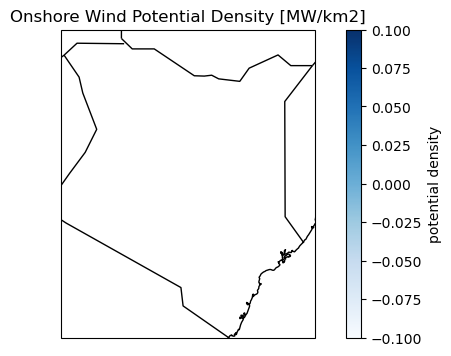

In [47]:
plot_voronoi(
    pypsa.Network('../../pypsa-earth/results/Kenya_geo_pot/postnetworks/elec_s_2_ec_lcopt_Co2L0.00-3H_3H_2050_0.071_NZ_50export.nc'),
    "onwind",
    "onshore",
    "Blues",
    ccrs.PlateCarree(),
    title="Onshore Wind Potential Density [MW/km2]",
)

In [ ]:
plot_voronoi(
    pypsa.Network('network.nc'),
    "solar",
    "onshore",
    "OrRd",
    ccrs.PlateCarree(),
    title="Solar Photovoltaic Potential Density [MW/km2]",
)

### 🧮 Results

---

📊 `pypsa.statistics`

The `pypsa.statistics` module provides a set of high-level functions for analyzing and summarizing the results of PyPSA models. It enables users to compute key metrics such as:

- **Generation mix** by technology  
- **Installed capacity** summaries  
- **Line loading** and **congestion metrics**  
- **Costs and revenues** by component  
- **CO₂ emissions** and carbon intensity  
- **Regional energy balances** and **power flows**

These functions are especially useful for post-processing model results and producing plots or reports for scenario analysis, capacity expansion studies, and policy evaluation.

The module works directly with the PyPSA `Network` object and leverages pandas operations internally, so results are returned as DataFrames that can be easily visualized or exported.




In [ ]:
s = network.statistics

You can easily have an comprehensive overview of the system level results.

In [ ]:
s(comps='Generator')

Let's have a look to optimal renewable capacities.

In [ ]:
(
    s.optimal_capacity(
        bus_carrier=["AC", "low voltage"],
        comps="Generator",
    ).div(
        1e3
    )  # GW
)

---
📈 `pypsa.plot`

PyPSA also includes a built-in `pypsa.plot` module that provides a small set of standard plotting functions. These are useful for quickly visualizing key aspects of your network, such as:

- Network topology (buses, lines, generators)
- Line loading and power flows
- Generation dispatch over time
- Installed capacities and time-series data

These plots are useful for exploratory analysis and debugging and can be customized using `matplotlib`.

For more advanced or interactive visualizations, you may consider combining PyPSA outputs with external libraries such as `plotly`, `holoviews`, or `hvplot`.


In [ ]:
# let's fill missing colors first
pd.options.plotting.backend = "matplotlib"
network.carriers.loc["none", "color"] ="#000000"
network.carriers.loc["", "color"] = "#000000"

Let's now plot the optimal renewable capacities that we investigated before.

In [ ]:
s.optimal_capacity(comps='Generator').drop('load').sort_values(ascending=False).plot(kind='bar')

### ⁉ Like to see more?

Check out the documentation here:

https://pypsa-earth.readthedocs.io/en/latest/

And the full workshop notebook (which this is adopted from) by OET here:

https://github.com/open-energy-transition/EIS-2025

And do not forget about the learning videos:

https://www.youtube.com/watch?v=hY5WgtZZv20&list=PLaXo6_ws0ZKJUYyUu-e6HRUcjuZnen7pA



